# Setup

In [1]:
# Python 3 compatability
from __future__ import division, print_function

# system functions that are always useful to have
import time, sys, os

# basic numeric setup
import numpy as np
import math
from numpy import linalg
import scipy
from scipy import stats

# plotting
import matplotlib
from matplotlib import pyplot as plt

# fits data
from astropy.io import fits

# inline plotting
%matplotlib inline

In [2]:
# re-defining plotting defaults
from matplotlib import rcParams
rcParams.update({'xtick.major.pad': '7.0'})
rcParams.update({'xtick.major.size': '7.5'})
rcParams.update({'xtick.major.width': '1.5'})
rcParams.update({'xtick.minor.pad': '7.0'})
rcParams.update({'xtick.minor.size': '3.5'})
rcParams.update({'xtick.minor.width': '1.0'})
rcParams.update({'ytick.major.pad': '7.0'})
rcParams.update({'ytick.major.size': '7.5'})
rcParams.update({'ytick.major.width': '1.5'})
rcParams.update({'ytick.minor.pad': '7.0'})
rcParams.update({'ytick.minor.size': '3.5'})
rcParams.update({'ytick.minor.width': '1.0'})
rcParams.update({'axes.titlepad': '15.0'})
rcParams.update({'axes.labelpad': '15.0'})
rcParams.update({'font.size': 30})

# SDSS Stripe 82

Plot comparisons to data from SDSS Stripe 82.

In [3]:
# convert from fluxes to magnitudes
def magnitude(phot, err, zeropoints=1.):

    mag = -2.5 * np.log10(phot / zeropoints)
    mag_err = 2.5 / np.log(10.) * err / phot

    return mag, mag_err

# convert from magnitudes to fluxes
def inv_magnitude(mag, err, zeropoints=1.):
    
    phot = 10**(-0.4 * mag) * zeropoints
    phot_err = err * 0.4 * np.log(10.) * phot
    
    return phot, phot_err

bands = ['U', 'G', 'R', 'I', 'Z']
cpivot, mrange = 1e-4, 2.  # pivot point & mag range used to shift offsets
nmin = 10  # minimum number of objects required to plot results
boxcar = 6  # bins used for boxcar used to determine variance for plotting
mgrid = np.arange(16, 28., 0.1)  # magnitude bins
dmgrid = np.arange(-0.3, 0.3, 0.01)  # dmag bins
dmpgrid = np.arange(-0.05, 0.05, 1e-5)  # dmag (predicted) bins
fbins = 0.4  # fraction of occupied bins above threshold
objthresh = 500  # the number of objects we need x nmin

In [4]:
from astropy.coordinates import SkyCoord
from astropy import units as u

# load data
s82_stack = fits.open('data/s82/s82.fits')[1].data
s82_runs = fits.open('data/s82/dr14aper.fits')[1].data

# stacked data
ra, dec = s82_stack['ra'], s82_stack['dec']
mtrue, metrue = s82_stack['psfcounts'], s82_stack['psfcountserr']
ftrue, fetrue = inv_magnitude(mtrue, metrue, zeropoints=1e9)
c = SkyCoord(ra=ra*u.degree, dec=dec*u.degree)

# individual run data
ra2, dec2 = s82_runs['ra'], s82_runs['dec']
fobs, feobs = s82_runs['psfflux'], s82_runs['psfflux_ivar']**-0.5
fobs2, feobs2 = s82_runs['aperflux6'], s82_runs['fiberflux_ivar']**-0.5
mobs, meobs = magnitude(fobs, feobs, zeropoints=1e9)
mobs2, meobs2 = magnitude(fobs2, feobs2, zeropoints=1e9)
c2 = SkyCoord(ra=ra2*u.degree, dec=dec2*u.degree)

# sort runs by FWHM
runs = np.unique(s82_runs['run'])  # individual runs
fwhm = np.array([np.median(s82_runs['psf_fwhm'][s82_runs['run'] == run], 
                           axis=0)  # median FWHM in each band
                 for run in runs])  # over each run
sort_idx = np.argsort(fwhm, axis=0)
runs_sorted = runs[sort_idx]
fwhm_sorted = np.array([fwhm[sort_idx[:, i], i] for i in range(5)]).T

# match catalogs
match_idx, d2d, _ = c2.match_to_catalog_sky(c)
match_sel = d2d.arcsec < 0.5

/home/joshspeagle/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:12: RuntimeWarning: overflow encountered in power
  if sys.path[0] == '':
/home/joshspeagle/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:16: RuntimeWarning: divide by zero encountered in power
  app.launch_new_instance()
/home/joshspeagle/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: divide by zero encountered in power
/home/joshspeagle/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in log10
  after removing the cwd from sys.path.
/home/joshspeagle/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in log10
  after removing the cwd from sys.path.
/home/joshspeagle/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in true_divide
  """


In [5]:
# grab number of non-zero figures per band
panels = np.zeros(5, dtype='int')
for i in range(5):
    for r in runs_sorted[:, i]:
        # select objects
        rsel = s82_runs['run'] == r
        sel = (rsel & match_sel)
        mo, moe = mobs[sel, i], meobs[sel, i]
        mo2, moe2 = mobs2[sel, i], meobs2[sel, i]
        m, me = mtrue[match_idx[sel], i], metrue[match_idx[sel], i]
        # clean
        clean = ((mo < 30.) & np.isfinite(mo) & np.isfinite(moe) &
                 (mo2 < 30.) & np.isfinite(mo2) & np.isfinite(moe2) &
                 (m < 22.9) & np.isfinite(m) & np.isfinite(me) &
                 (s82_stack['objc_prob_psf'][match_idx[sel]] > 0.99) & 
                 (np.abs(m - mo) < 2.)  & (np.abs(m - mo2) < 2.))
        # only include run if enough clean objects exist
        if sum(clean) > nmin * objthresh:
            mo, moe, mo2, moe2 = mo[clean], moe[clean], mo2[clean], moe2[clean]
            m, me = m[clean], me[clean]
            mgrid_t, dmgrid_t = np.array(mgrid), np.array(dmgrid)  # temp grids
            while True:
                n, _, _ = np.histogram2d(m, m - mo, [mgrid_t, dmgrid_t])
                # lower resolution if we don't have enough bins with enough counts
                if np.sum(n > nmin)/np.sum(n > 0) < fbins:
                    mgrid_t, dmgrid_t = mgrid_t[::2], dmgrid_t[::2]
                else:
                    break
            panels[i] += 1
    print(bands[i], ':', panels[i], 'panels')

/home/joshspeagle/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in less
  app.launch_new_instance()


U : 61 panels
G : 62 panels
R : 61 panels
I : 63 panels
Z : 63 panels


/home/joshspeagle/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in less
/home/joshspeagle/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:49: RuntimeWarning: invalid value encountered in true_divide
/home/joshspeagle/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:65: RuntimeWarning: invalid value encountered in true_divide
/home/joshspeagle/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:70: RuntimeWarning: invalid value encountered in true_divide
/home/joshspeagle/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:75: RuntimeWarning: invalid value encountered in less
/home/joshspeagle/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:85: RuntimeWarning: invalid value encountered in greater


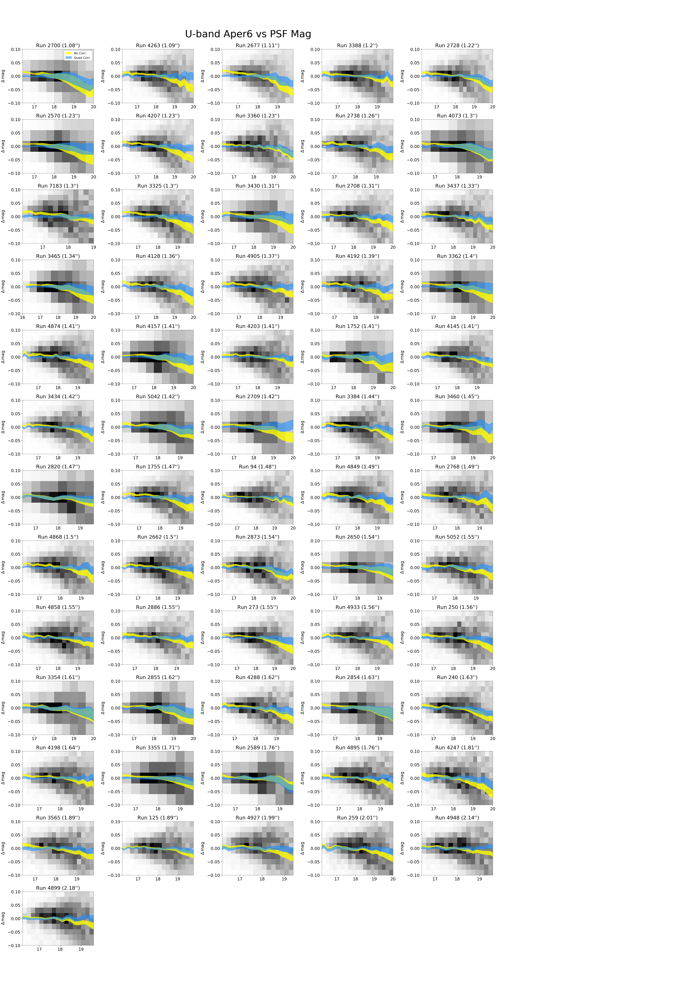

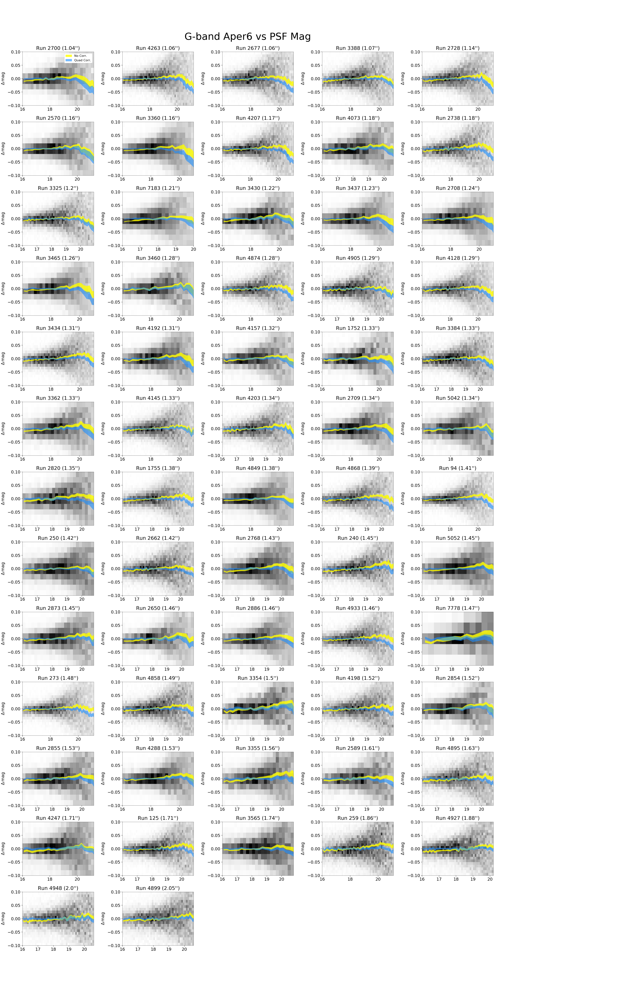

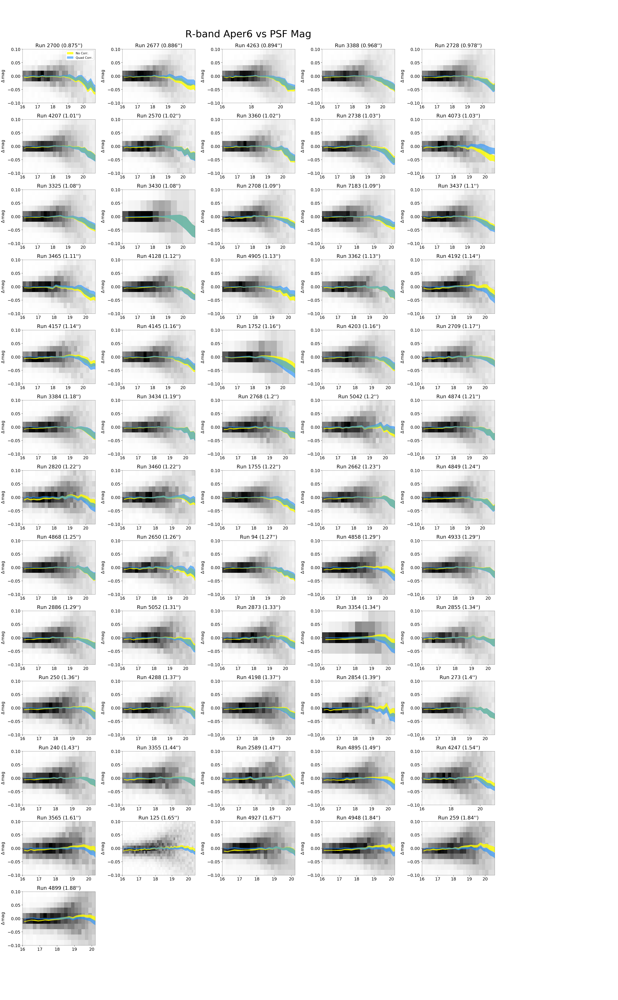

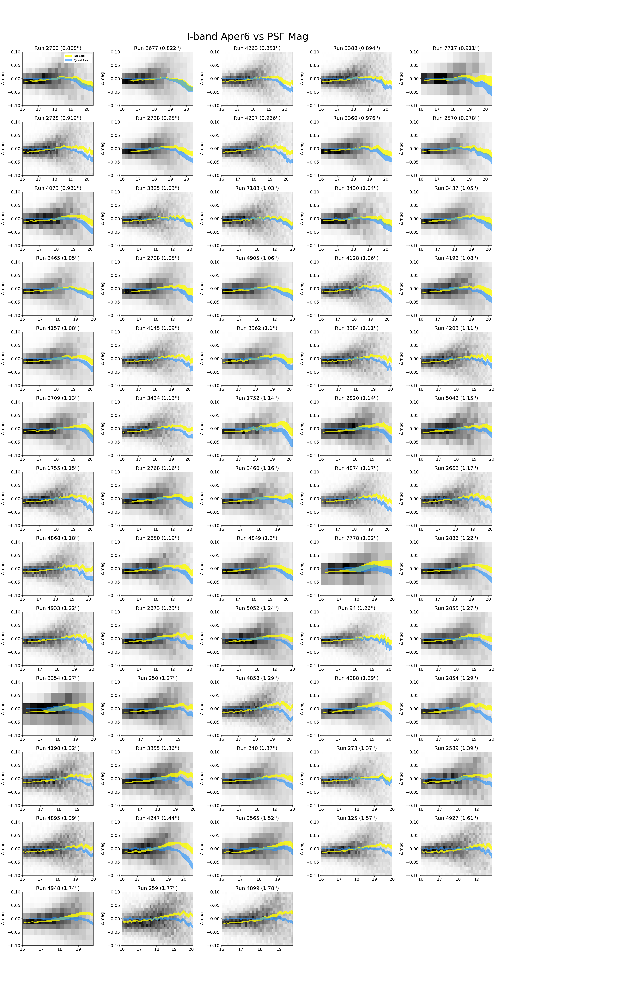

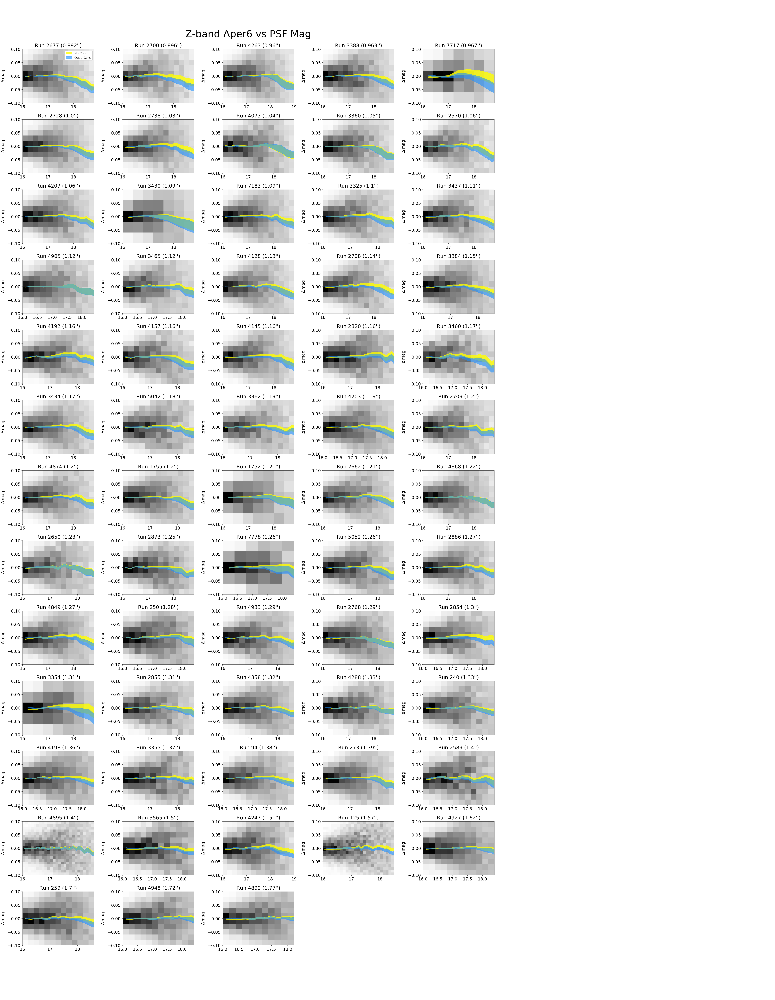

In [8]:
# plot results per band

for i in range(5):

    rows = (panels[i] + 5) // 5
    plt.figure(figsize=(50, 7 * rows))
    plt.suptitle('{}-band Aper6 vs PSF Mag'.format(bands[i]), y=1.01, fontsize=70)

    # plot individual runs
    count = 0
    for r, rfwhm in zip(runs_sorted[:, i], fwhm_sorted[:, i]):
        # select objects
        rsel = s82_runs['run'] == r
        sel = (rsel & match_sel)
        mo, moe = mobs[sel, i], meobs[sel, i]
        mo2, moe2 = mobs2[sel, i], meobs2[sel, i]
        m, me = mtrue[match_idx[sel], i], metrue[match_idx[sel], i]
        # clean
        clean = ((mo < 30.) & np.isfinite(mo) & np.isfinite(moe) &
                 (mo2 < 30.) & np.isfinite(mo2) & np.isfinite(moe2) &
                 (m < 22.9) & np.isfinite(m) & np.isfinite(me) &
                 (s82_stack['objc_prob_psf'][match_idx[sel]] > 0.99) & 
                 (np.abs(m - mo) < 2.) & (np.abs(m - mo2) < 2.))
        # only include run if enough clean objects exist
        if sum(clean) > nmin * objthresh:
            mo, moe, mo2, moe2 = mo[clean], moe[clean], mo2[clean], moe2[clean]
            m, me = m[clean], me[clean]
            if i < 4:
                moff = np.median((mo2 - mo)[(m > 17.) & (m < 19.)])
            else:
                moff = np.median((mo2 - mo)[(m > 16.) & (m < 17.5)])

            # determine spacing
            mgrid_t, dmgrid_t = np.array(mgrid), np.array(dmgrid)  # temp grids
            while True:
                n, bx, by = np.histogram2d(m, mo2 - mo - moff, [mgrid_t, dmgrid_t])
                # lower resolution if we don't have enough bins with enough counts
                if np.sum(n > nmin) / np.sum(n > 0) < fbins:
                    mgrid_t, dmgrid_t = mgrid_t[::2], dmgrid_t[::2]
                else:
                    break

            # dmag distribution (shifted)
            plt.subplot(rows, 5, 1 + count)
            n, bx, by, _ = plt.hist2d(m, mo2 - mo - moff, [mgrid_t, dmgrid_t], 
                                      cmap='Greys', zorder=1)
            xc, yc = 0.5 * (bx[1:] + bx[:-1]), 0.5 * (by[1:] + by[:-1])  # bin centers
            nmag = np.sum(n, axis=1)  # counts per magnitude bin
            nmean = np.sum(yc * n, axis=1) / np.sum(n, axis=1)  # mean
            nstd = np.sqrt(np.sum((yc[None, :] - nmean[:, None])**2 * n,
                                  axis=1) / np.sum(n, axis=1))  # error
            nidx = np.where(n.sum(axis=1) > nmin * 5)[0][0]
            nidx2 = np.where(n.sum(axis=1) > nmin * 5)[0][-1]

            # compute SNR as a function of magnitude
            mconst = 2.5 / np.log(10)
            fout, fe = inv_magnitude(mo, moe)
            fin, fe2 = inv_magnitude(m, me)
            snr = fout/np.sqrt(fe**2 + (0.02 * fout)**2)
            snr2 = fout/np.sqrt((5*fe)**2 + (0.02 * fout)**2)
            # first order
            n, bx, by = np.histogram2d(m, -mconst * snr**-2,
                                       [mgrid_t, dmpgrid])
            xc, yc = 0.5 * (bx[1:] + bx[:-1]), 0.5 * (by[1:] + by[:-1])
            cmean = np.sum(yc * n, axis=1) / np.sum(n, axis=1)
            # first order (inflated errors)
            n, bx, by = np.histogram2d(m, -mconst * snr2**-2,
                                       [mgrid_t, dmpgrid])
            xc2, yc2 = 0.5 * (bx[1:] + bx[:-1]), 0.5 * (by[1:] + by[:-1])
            cmean2 = np.sum(yc * n, axis=1) / np.sum(n, axis=1)

            # prettify
            plt.ylabel(r'$\Delta\,$mag')
            try:
                midx = np.where(cmean2 < -0.035)[0][0]
            except:
                midx = nidx2
                pass
            plt.xlim([mgrid_t[nidx], mgrid_t[midx]])
            plt.ylim([-0.1, 0.1])
            plt.title("Run {:d} ({:2.3}'')".format(r, rfwhm))
            plt.tight_layout()

            # plot bias
            mhigh = xc[np.abs(cmean - np.nanmax(np.abs(cmean))) > cpivot][0]
            mlow = mhigh - mrange
            nsel = nmag > nmin
            nmean_err = nstd/np.sqrt(nmag)
            nmean_serr = np.array([np.std(nmean[i:i+boxcar]) for i in range(len(nmean) - boxcar)])
            nmean_err[boxcar//2:-boxcar//2] = np.sqrt(nmean_err[boxcar//2:-boxcar//2]**2 + nmean_serr**2)
            plt.fill_between(xc[nsel], (nmean - nmean_err)[nsel],
                             (nmean + nmean_err)[nsel], color='yellow', alpha=0.8, zorder=2)
            # apply linear bias correction
            if i < 4:
                # UGRI
                lin_coeff = np.polyfit(xc[(xc >= 16) & (xc <= 19) & nsel], 
                                       nmean[(xc >= 16) & (xc <= 19) & nsel], 2)
            else:
                # Z
                lin_coeff = np.polyfit(xc[(xc >= 16) & (xc <= 17.5) & nsel], 
                                       nmean[(xc >= 16) & (xc <= 17.5) & nsel], 1)
            lin_off = np.poly1d(lin_coeff)(xc)
            nmean -= lin_off
            plt.fill_between(xc[nsel], (nmean - nmean_err)[nsel],
                             (nmean + nmean_err)[nsel], color='dodgerblue', alpha=0.6, zorder=2)
            
            # legend
            if count == 0:
                plt.legend(['No Corr.', 'Quad Corr.'], 
                            framealpha=1., fontsize=22)

            # increment counter
            count += 1
            
    # save figure
    plt.savefig('plots/s82_{}_aper6.png'.format(bands[i]), bbox_inches='tight')